In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.semi_supervised import LabelPropagation
from sklearn.metrics import make_scorer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import LabelEncoder
import cv2
import sys
sys.path.append('../utils')
from  configloader import Configloader
from database import Database
import file_io
import matplotlib.image as mpimg
import cnn_helpers
import time


2025-04-06 15:06:51.484547: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE3 SSE4.1 SSE4.2 AVX AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:

# Ensure TensorFlow/PyTorch compatibility if needed for deep feature extraction
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.models import Model
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

In [3]:
config = Configloader()

db = Database(config)
db.connect()
#image directory: 
basedir = config.get('settings', 'image_directory')


Connection established


In [4]:
# Define angle tags and their corresponding ordinal positions
ANGLES = ["front", "frontleft", "left", "rearleft", "rear", "rearright", "right", "frontright"]
ORDINAL_MAP = {tag: i for i, tag in enumerate(ANGLES)}

In [5]:
# Penalty matrix based on circular adjacency
PENALTY_MATRIX = np.zeros((len(ANGLES), len(ANGLES)))
for i in range(len(ANGLES)):
    for j in range(len(ANGLES)):
        distance = min(abs(i - j), len(ANGLES) - abs(i - j))
        PENALTY_MATRIX[i, j] = distance

In [6]:
# Function to extract image features using ResNet50
def extract_features(df, use_bounding_boxes=False, time_testing=False):
    base_model = ResNet50(weights="imagenet", include_top=False, pooling="avg")
    model = Model(inputs=base_model.input, outputs=base_model.output)

    features = []
    time_details = []
    for row in df.iterrows():
    #for i, path in enumerate(df['abs_image_path']):
        if time_testing:
            start = time.time()
        image_path = row[1]['abs_image_path']
        img = cv2.imread(image_path)
        x1 = row[1]['yolobox_top_left_x']
        y1 = row[1]['yolobox_top_left_y']
        x2 = row[1]['yolobox_bottom_right_x']
        y2 = row[1]['yolobox_bottom_right_y']
        if use_bounding_boxes and x1 != x2:
            img = img[y1:y2, x1:x2]

        img = cv2.resize(img, (224, 224))
        img = preprocess_input(img)
        img = np.expand_dims(img, axis=0)

        feature = model.predict(img)
        features.append(feature.squeeze())
        if time_testing:
            time_details.append(time.time()-start)
    if not time_testing:
        return np.array(features)
    else: 
        return time_details

In [7]:
#get the labeled data: 
tags = db.execute_query("""SELECT image_id, 
                            angle, 
                            images.yolobox_top_left_x, 
                            images.yolobox_top_left_y, 
                            images.yolobox_bottom_right_x, 
                            images.yolobox_bottom_right_y, 
                            images.image_path 
                        FROM angletags 
                        JOIN images on images.id = angletags.image_id 
                        WHERE 
                            manual_annotation = 1""")
labeled_data = pd.DataFrame(tags).fillna(-1)
labeled_data = cnn_helpers.cast_bbox_values(labeled_data)

labeled_data.sample(5)

,image_id,angle,yolobox_top_left_x,yolobox_top_left_y,yolobox_bottom_right_x,yolobox_bottom_right_y,image_path
5074,547204,crappy,-1,-1,-1,-1,volkswagen\Tiguan (alle)\04116633-7f68-4e37-b6...
16418,301012,crappy,-1,-1,-1,-1,porsche\Macan\dcaaf728-670c-41d3-8592-7d786ec2...
11042,205642,crappy,13,0,391,357,hyundai\i40\f0238167-31c1-4884-9aed-e8c5f8818a...
9586,1224090,crappy,-1,-1,-1,-1,land-rover\Range Rover Sport\e01e57a5-d676-4a7...
11694,1213192,crappy,-1,-1,-1,-1,land-rover\Defender\b4efc8d4-2447-4e02-b70f-79...


In [8]:
#get the unlabeled data: 
untagged = db.execute_query("""SELECT 
                                image_path, 
                                yolobox_top_left_x,
                                yolobox_top_left_y,
                                yolobox_bottom_right_x,
                                yolobox_bottom_right_y
                            FROM images
                            LEFT JOIN angletags on images.id = angletags.image_id
                            WHERE angletags.pk IS NULL
""")
unlabeled_data = pd.DataFrame(untagged).fillna(-1)
unlabeled_data = cnn_helpers.cast_bbox_values(unlabeled_data)

unlabeled_data.sample(5)

,image_path,yolobox_top_left_x,yolobox_top_left_y,yolobox_bottom_right_x,yolobox_bottom_right_y
4192282,/bmw/5 Reeks (alle)/2141574e-a85e-4099-8fc0-d9...,82,216,638,433
14633141,/peugeot/308/734bd64a-fa68-49d4-a39f-2f31d2e0a...,2,1,703,415
11090151,/peugeot/3008/85c74ddf-372b-40b4-a855-9459bc20...,54,190,705,461
13721167,/volkswagen/Tiguan (alle)/955d235b-4c52-430f-8...,-1,-1,-1,-1
13021368,/skoda/Fabia/1fd2bb71-ffad-4eb3-a016-80b8ea882...,-1,-1,-1,-1


In [9]:
unlabeled_data = file_io.make_absolute_path(unlabeled_data, basedir, 'image_path', 'abs_image_path', True)
labeled_data = file_io.make_absolute_path(labeled_data, basedir, 'image_path', 'abs_image_path', True)


In [10]:
#image_paths_labeled = labeled_data["abs_image_path"].values
labels = labeled_data["angle"].values

#image_paths_unlabeled = unlabeled_data["abs_image_path"].values


In [11]:

# Optionally include bounding boxes
use_bounding_boxes = True  # Set to False if bounding boxes are not needed


In [12]:
# Extract features
features_labeled = extract_features(labeled_data, use_bounding_boxes)


2025-04-06 15:08:32.247883: I external/local_xla/xla/stream_executor/rocm/rocm_executor.cc:920] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2025-04-06 15:08:34.448064: I external/local_xla/xla/stream_executor/rocm/rocm_executor.cc:920] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2025-04-06 15:08:34.448158: I external/local_xla/xla/stream_executor/rocm/rocm_executor.cc:920] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2025-04-06 15:08:34.448173: I tensorflow/core/common_runtime/gpu/gpu_device.cc:2397] Ignoring visible gpu device (device: 0, name: AMD Radeon RX 6700 XT, pci bus id: 0000:2d:00.0) with AMDGPU version : gfx1031. The supported AMDGPU versions are gfx900, gfx906, gfx908, gfx90a, gfx940, gfx941, gfx942, gfx1030, gfx110

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 821ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━

In [34]:
random_unlabled_data = unlabeled_data.sample(500)

In [35]:
random_unlabled_data.head(10)

,yolobox_top_left_x,yolobox_top_left_y,yolobox_bottom_right_x,yolobox_bottom_right_y,abs_image_path
6544165,-1,-1,-1,-1,/home/frederic/Documents/automotive_image_data...
15473422,-1,-1,-1,-1,/home/frederic/Documents/automotive_image_data...
9439848,-1,-1,-1,-1,/home/frederic/Documents/automotive_image_data...
1154708,100,81,613,502,/home/frederic/Documents/automotive_image_data...
13051814,-1,-1,-1,-1,/home/frederic/Documents/automotive_image_data...
5105692,-1,-1,-1,-1,/home/frederic/Documents/automotive_image_data...
2371658,-1,-1,-1,-1,/home/frederic/Documents/automotive_image_data...
3412586,15,105,714,392,/home/frederic/Documents/automotive_image_data...
10601361,-1,-1,-1,-1,/home/frederic/Documents/automotive_image_data...
10976502,-1,-1,-1,-1,/home/frederic/Documents/automotive_image_data...


In [36]:
#use resnet to extract the image features
features_unlabeled = extract_features(random_unlabled_data, use_bounding_boxes)



1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━

In [37]:

# Split labeled data into "crappy" and "not crappy"
crappy_mask = (labels == "crappy")
not_crappy_mask = ~crappy_mask


In [38]:

# Train a binary classifier for "crappy" vs "not crappy"
binary_labels = np.where(crappy_mask, 1, 0)
X_train_binary, X_test_binary, y_train_binary, y_test_binary = train_test_split(features_labeled, binary_labels, test_size=0.2, random_state=42)

binary_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
binary_classifier.fit(X_train_binary, y_train_binary)


RandomForestClassifier(random_state=42)

In [39]:

# Evaluate binary classifier
binary_predictions = binary_classifier.predict(X_test_binary)
print("Binary Classifier Report:")
print(classification_report(y_test_binary, binary_predictions))


Binary Classifier Report:
              precision    recall  f1-score   support

           0       0.92      0.98      0.95      1482
           1       0.99      0.95      0.97      2518

    accuracy                           0.96      4000
   macro avg       0.95      0.96      0.96      4000
weighted avg       0.96      0.96      0.96      4000



In [40]:

# Predict "crappy" vs "not crappy" for unlabeled data (already using the smaller subset of randomly selected images)
binary_predictions_unlabeled = binary_classifier.predict(features_unlabeled)


In [41]:
random_unlabled_data['is_crap'] = binary_predictions_unlabeled

In [42]:

# Separate non-crappy unlabeled data
non_crappy_indices = np.where(binary_predictions_unlabeled == 0)[0]
non_crappy_features_unlabeled = features_unlabeled[non_crappy_indices]


In [43]:

# Prepare data for angle classification
angle_labels = labels[not_crappy_mask]
angle_features = features_labeled[not_crappy_mask]


In [44]:

# Encode angle labels
label_encoder = LabelEncoder()
angle_labels_encoded = label_encoder.fit_transform(angle_labels)


In [45]:

# Apply semi-supervised learning for angle classification
X = np.vstack((angle_features, non_crappy_features_unlabeled))
y = np.hstack((angle_labels_encoded, [-1] * len(non_crappy_features_unlabeled)))  # -1 indicates unlabeled


In [46]:

label_propagation = LabelPropagation(kernel="knn", n_neighbors=5)
label_propagation.fit(X, y)


LabelPropagation(kernel='knn', n_neighbors=5)

In [47]:

# Predict for non-crappy unlabeled data
predicted_labels_unlabeled = label_propagation.transduction_[-len(non_crappy_features_unlabeled):]
predicted_labels_unlabeled = label_encoder.inverse_transform(predicted_labels_unlabeled)




In [48]:
random_unlabled_data.head()

,yolobox_top_left_x,yolobox_top_left_y,yolobox_bottom_right_x,yolobox_bottom_right_y,abs_image_path,is_crap
6544165,-1,-1,-1,-1,/home/frederic/Documents/automotive_image_data...,1
15473422,-1,-1,-1,-1,/home/frederic/Documents/automotive_image_data...,1
9439848,-1,-1,-1,-1,/home/frederic/Documents/automotive_image_data...,1
1154708,100,81,613,502,/home/frederic/Documents/automotive_image_data...,0
13051814,-1,-1,-1,-1,/home/frederic/Documents/automotive_image_data...,1


In [49]:
# Save results
random_unlabled_data["predicted_label"] = "crappy"
random_unlabled_data.iloc[non_crappy_indices, random_unlabled_data.columns.get_loc("predicted_label")] = predicted_labels_unlabeled
#unlabeled_data.to_csv("predicted_unlabeled_data.csv", index=False)

print("Semi-supervised learning completed. Predictions saved.")

Semi-supervised learning completed. Predictions saved.


In [50]:
random_unlabled_data['predicted_label'].value_counts()

predicted_label
crappy        329
frontleft      45
rearleft       27
left           23
rear           22
front          21
rearright      15
frontright     13
right           5
Name: count, dtype: int64

In [51]:
def render_images(image_paths, title):
    """
    Render a list of images using Matplotlib.

    Parameters:
    - image_paths (list): List of file paths to the images to display.
    """
    if not image_paths:
        print("No images to display.")
        return

    # Determine the grid size for subplots (e.g., 2 columns)
    num_images = len(image_paths)
    cols = 2
    rows = (num_images + cols - 1) // cols  # Calculate rows needed
    
    # Create a figure with dynamic size
    fig, axes = plt.subplots(rows, cols, figsize=(10, 5 * rows))
    axes = axes.flatten() if num_images > 1 else [axes]  # Handle single image case
    fig.suptitle(title)
    i = 0
    # Loop through the image paths and render each image
    for image_path in image_paths:
        try:
            img = mpimg.imread(image_path)
            axes[i].imshow(img)
            axes[i].set_title(os.path.basename(image_path), fontsize=10)
            axes[i].axis('off')  # Hide axes
        except Exception as e:
            axes[i].text(0.5, 0.5, "Error loading image", fontsize=12, ha='center')
            axes[i].axis('off')
            print(f"Error displaying {image_path}: {e}")
        i+=1
    # Hide any unused subplot axes
    for j in range(len(image_paths), len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

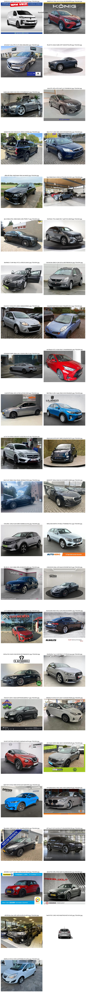

In [52]:
show_for = 'frontleft'
show = random_unlabled_data.query(f"predicted_label == '{show_for}' ")['abs_image_path'].to_list()

render_images(show, f'{show_for} sides')

# Bonus: are bounding boxes worth the effort?

In [53]:
testsize = 5000
new_sample = unlabeled_data.sample(testsize)

performance_nobox = extract_features(new_sample, False, True)
performance_wbox = extract_features(new_sample, True, True)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━

Text(0.5, 1.0, 'Computation Times')

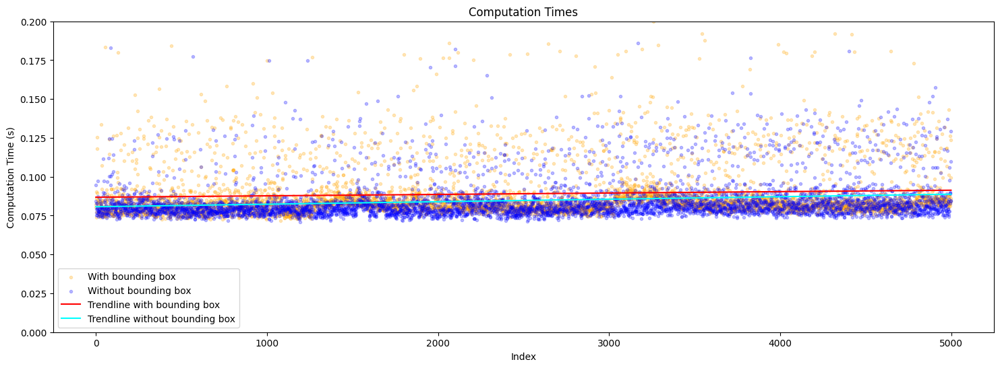

In [55]:
items = len(performance_nobox[1:])
plt.figure(figsize=(18, 6))

# Plot the first list in orange
plt.scatter(range(items), performance_wbox[1:], color='orange', label='With bounding box', marker='.', alpha = 0.25)

# Plot the second list in blue
plt.scatter(range(items), performance_nobox[1:], color='blue', label='Without bounding box', marker='.', alpha = 0.25)

# Add trendline for the first list (orange)
z_wbox = np.polyfit(range(items), performance_wbox[1:], 1)  # Linear fit (1st degree polynomial)
p_wbox = np.poly1d(z_wbox)
plt.plot(range(items), p_wbox(range(items)), color='red',  label='Trendline with bounding box')

# Add trendline for the second list (blue)
z_nobox = np.polyfit(range(items), performance_nobox[1:], 1)  # Linear fit (1st degree polynomial)
p_nobox = np.poly1d(z_nobox)
plt.plot(range(items), p_nobox(range(items)), color='cyan', label='Trendline without bounding box')

plt.ylim(0.0, 0.2)
plt.legend()

# Labels and title
plt.xlabel('Index')
plt.ylabel('Computation Time (s)')
plt.title('Computation Times')

Conclusions:
- applying bounding boxes to an image slows down the operation (even if there's less data), we can explain this because even with the crop the image still needs to be resized to fit the shape required by the model (restne 50 == 224 224 3)
- Just using feature extractions from resnet does not seem to be very productive - aborting this approach and considering it experimental.
- Not using bounding boxes seems to be less scalable than using boundingboxes (slight increase left to right in cyan line) ==> remember we need something that scales: this were 5000 images, we have about 15.6 million!!